$$\text{Golden Retriever vs Rottweiler vs German Shepard}$$

In [170]:
import pandas as pd 

data = pd.read_csv("dogs.csv")

train_data = data[data['data set'] == 'train']
valid_data = data[data['data set'] == 'valid']
test_data = data[data['data set'] == 'test']

train_data = train_data[train_data['labels'].isin(['Golden Retriever', 'Rottweiler', 'German Sheperd'])]
valid_data = valid_data[valid_data['labels'].isin(['Golden Retriever', 'Rottweiler', 'German Sheperd'])]
test_data = test_data[test_data['labels'].isin(['Golden Retriever', 'Rottweiler', 'German Sheperd'])]

train_data

,filepaths,labels,data set
4126,train/German Sheperd/001.jpg,German Sheperd,train
4127,train/German Sheperd/002.jpg,German Sheperd,train
4128,train/German Sheperd/003.jpg,German Sheperd,train
4129,train/German Sheperd/004.jpg,German Sheperd,train
4130,train/German Sheperd/005.jpg,German Sheperd,train
...,...,...,...
6972,train/Rottweiler/94.jpg,Rottweiler,train
6973,train/Rottweiler/95.jpg,Rottweiler,train
6974,train/Rottweiler/96.jpg,Rottweiler,train
6975,train/Rottweiler/97.jpg,Rottweiler,train


In [171]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255)
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)


train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_data,
    directory='.',
    x_col='filepaths',
    y_col='labels',
    batch_size=60,
    class_mode='categorical')

validation_generator = valid_datagen.flow_from_dataframe(
    dataframe=valid_data,
    directory='.',
    x_col='filepaths',
    y_col='labels',
    batch_size=15,
    class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_data,
    directory='.',
    x_col='filepaths',
    y_col='labels',
    batch_size=30,
    class_mode='categorical',
    shuffle=False)

batch = train_generator.next()

Found 334 validated image filenames belonging to 3 classes.
Found 30 validated image filenames belonging to 3 classes.
Found 30 validated image filenames belonging to 3 classes.


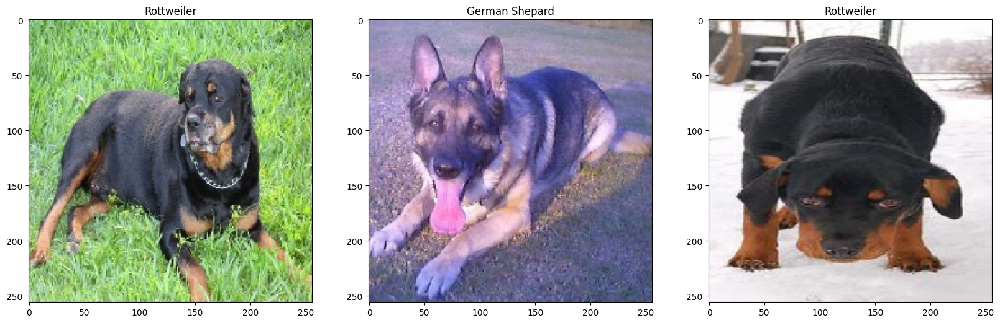

In [172]:
import matplotlib.pyplot as plt

def breed_v2(arr):
    if arr[0] == 1:
        return 'German Shepard' 
    elif arr[1] == 1:
        return 'Golden Retriever'
    elif arr[2] == 1:
        return 'Rottweiler'

figure, dim = plt.subplots(ncols=3, figsize=(20,20))
for i, img in enumerate(batch[0][0:3]):
    dim[i].imshow(img)
    dim[i].title.set_text(breed_v2(batch[1][i]))

In [173]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

number_of_breeds = 3

model = Sequential([
    # Convolutional layer that extracts features from the images
    Conv2D(32, (3, 3), 1, activation='relu', input_shape=(256, 256, 3)),
    MaxPooling2D(2, 2),
    # The first pair of convolution and maxpooling layers

    # Adding more layers to make the network deeper
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    
    # Flattening the output of the conv layers to feed it into the dense layers
    Flatten(),
    Dropout(0.5),  # Dropout for regularization

    # Dense (fully connected) layers for classification
    Dense(512, activation='relu'),
    Dense(number_of_breeds, activation='softmax')  # number_of_breeds should be the total number of dog breeds
])

In [174]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [176]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d_24 (MaxPooli  (None, 127, 127, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_25 (MaxPooli  (None, 62, 62, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_26 (Conv2D)          (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_26 (MaxPooli  (None, 30, 30, 128)      

In [177]:
history = model.fit(
    train_generator,
    epochs=30,  # Number of epochs to train for
    validation_data=validation_generator,
    callbacks=[tf.keras.callbacks.TensorBoard(log_dir='logs')]
)

Epoch 1/30
6/6 [==============================] - 8s 1s/step - loss: 1.4470 - accuracy: 0.3323 - val_loss: 1.0870 - val_accuracy: 0.4333
Epoch 2/30
6/6 [==============================] - 7s 1s/step - loss: 1.0787 - accuracy: 0.2964 - val_loss: 1.0048 - val_accuracy: 0.6333
Epoch 3/30
6/6 [==============================] - 7s 1s/step - loss: 0.8790 - accuracy: 0.6317 - val_loss: 1.1428 - val_accuracy: 0.5333
Epoch 4/30
6/6 [==============================] - 7s 1s/step - loss: 0.6585 - accuracy: 0.6617 - val_loss: 0.6349 - val_accuracy: 0.7000
Epoch 5/30
6/6 [==============================] - 7s 1s/step - loss: 0.4523 - accuracy: 0.8204 - val_loss: 0.7549 - val_accuracy: 0.7000
Epoch 6/30
6/6 [==============================] - 8s 1s/step - loss: 0.4592 - accuracy: 0.7814 - val_loss: 0.6684 - val_accuracy: 0.6333
Epoch 7/30
6/6 [==============================] - 7s 1s/step - loss: 0.3587 - accuracy: 0.8533 - val_loss: 0.6319 - val_accuracy: 0.7333
Epoch 8/30
6/6 [=========================

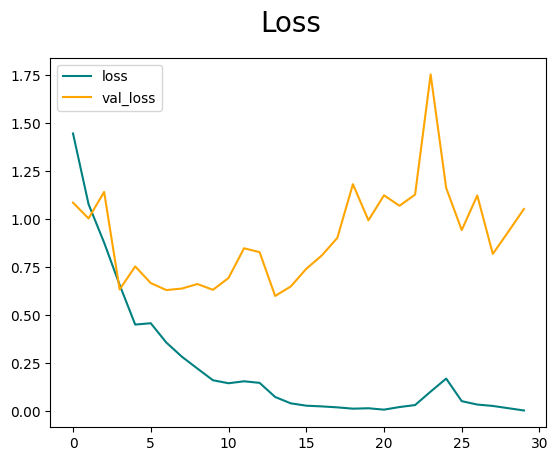

In [182]:
fig = plt.figure()
plt.plot(history.history['loss'], color='teal', label='loss')
plt.plot(history.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc='upper left')
plt.show()

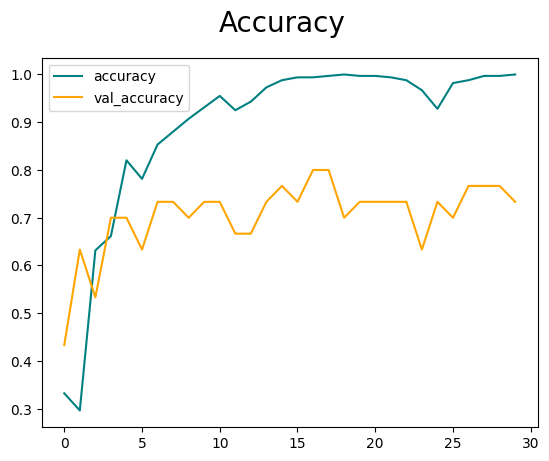

In [183]:
fig = plt.figure()
plt.plot(history.history['accuracy'], color='teal', label='accuracy')
plt.plot(history.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc='upper left')
plt.show()

In [180]:
model.evaluate(test_generator)

1/1 [==============================] - 0s 135ms/step - loss: 0.9859 - accuracy: 0.8000


[0.9858831167221069, 0.800000011920929]

In [181]:
model.save('three_breed_classifier.h5')

c:\Users\golde\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 0s 47ms/step
The predicted breed is: German Sheperd


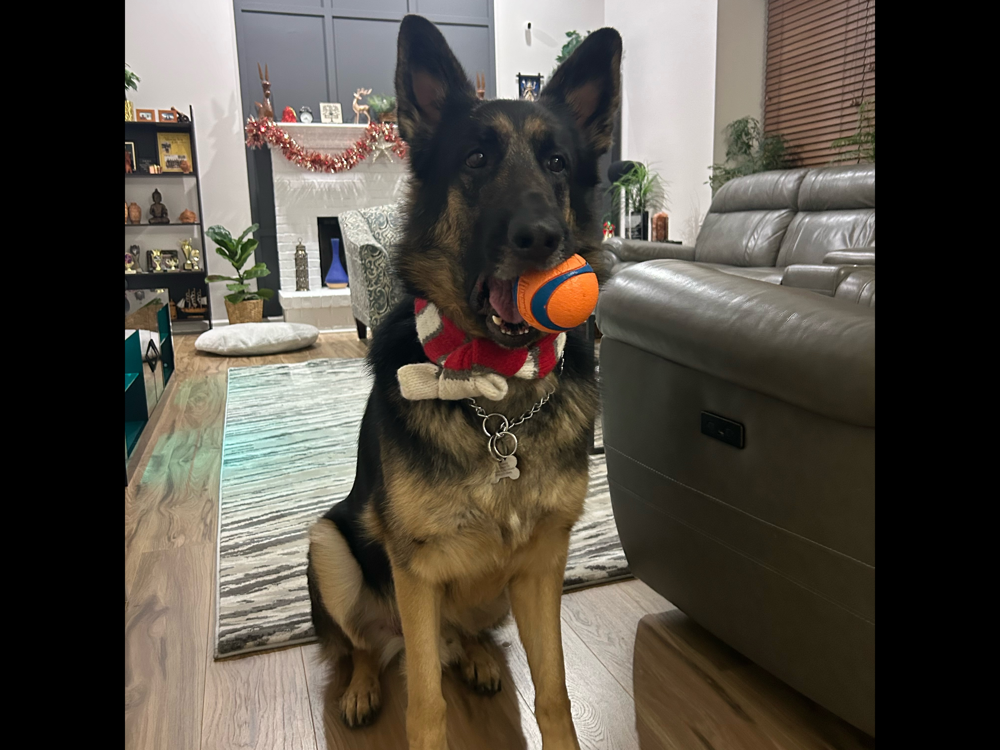

In [241]:
from keras.preprocessing.image import img_to_array, load_img
from keras.models import load_model
import numpy as np
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

model = load_model('three_breed_classifier.h5')

# Load the image
image = load_img('Duke/duke2.jpeg', target_size=(256, 256))
image = img_to_array(image)
image = image / 255.0
image = np.expand_dims(image, axis=0)

# Make a prediction
prediction = model.predict(image)

predicted_class_index = np.argmax(prediction, axis=1)

breed_names = {index: breed for breed, index in train_generator.class_indices.items()}
predicted_breed = breed_names[predicted_class_index[0]]

print(f"The predicted breed is: {predicted_breed}")

display_img = Image.open('Duke/duke2.jpeg')
display_img = display_img.rotate(270)
display(display_img)
